In [ ]:
!pip install diffusers transformers accelerate scipy safetensors
!pip install carvekit

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.4/297.4 kB 26.8 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinu

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
# https://stable-diffusion-art.com/change-background/

In [ ]:
# !unrar x "/content/drive/MyDrive/Colab Notebooks/Hoc_nhom_KHDL/Big_homework/big_homework_data.rar"

In [ ]:
from diffusers.utils import make_image_grid, load_image
import matplotlib.pyplot as plt

In [ ]:
import PIL.Image

from carvekit.api.interface import Interface
from carvekit.ml.wrap.fba_matting import FBAMatting
from carvekit.ml.wrap.tracer_b7 import TracerUniversalB7
from carvekit.pipelines.postprocessing import MattingMethod
from carvekit.pipelines.preprocessing import PreprocessingStub
from carvekit.trimap.generator import TrimapGenerator



# Check doc strings for more information
seg_net = TracerUniversalB7(device='cpu',
              batch_size=1)

fba = FBAMatting(device='cpu',
                 input_tensor_size=2048,
                 batch_size=1)
trimap = TrimapGenerator()
preprocessing = PreprocessingStub()
postprocessing = MattingMethod(matting_module=fba,
                               trimap_generator=trimap,
                               device='cpu')

interface = Interface(pre_pipe=preprocessing,
                      post_pipe=postprocessing,
                      seg_pipe=seg_net)



The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/carvekit/utils/download_models.py:106: UserWarning: Failed to download model from Carve CDN downloader. Trying to download from Huggingface.co downloader.
  warnings.warn(


In [ ]:
import cv2
import numpy as np

def get_mask(image):
  bg = interface([image])[0]
  bg = np.array(bg)
  mask_image = PIL.Image.fromarray(cv2.bitwise_not(bg[:, :, 3]))
  return mask_image

In [ ]:
from diffusers import StableDiffusionInpaintPipeline
import torch
model_id = "stabilityai/stable-diffusion-2-1"
# model_id = "runwayml/stable-diffusion-inpainting"
pipe = StableDiffusionInpaintPipeline.from_pretrained(
    model_id,
    revision="fp16",
    torch_dtype=torch.float16,
)
pipe = pipe.to("cuda")


#image and mask_image should be PIL images.
#The mask structure is white for inpainting and black for keeping as is

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/517 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/diffusers/pipelines/pipeline_loading_utils.py:212: FutureWarning: You are loading the variant fp16 from stabilityai/stable-diffusion-2-1 via `revision='fp16'` even though you can load it via `variant=`fp16`. Loading model variants via `revision='fp16'` is deprecated and will be removed in diffusers v1. Please use `variant='fp16'` instead.
  warnings.warn(
unet/diffusion_pytorch_model.safetensors not found


Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

scheduler/scheduler_config.json:   0%|          | 0.00/351 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/999 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/819 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/628 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/681M [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/1.73G [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

In [ ]:
def generate_batch(prompt, image, mask_image, num = 10):
  final_images = []
  for i in range(10):
    final_image = pipe(prompt=prompt, image=image, mask_image=mask_image).images[0]
    final_images.append(final_image.resize(image.size))
  return final_images

import os
def save_results(final_images, save_path):
  os.makedirs(save_path, exist_ok = True)
  for i in range(len(final_images)):
    final_images[i].save(f"{save_path}/result_{i}.png", "PNG")

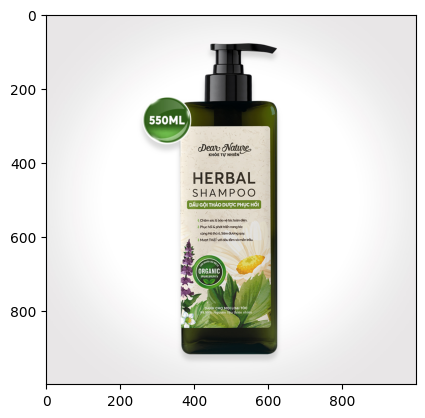

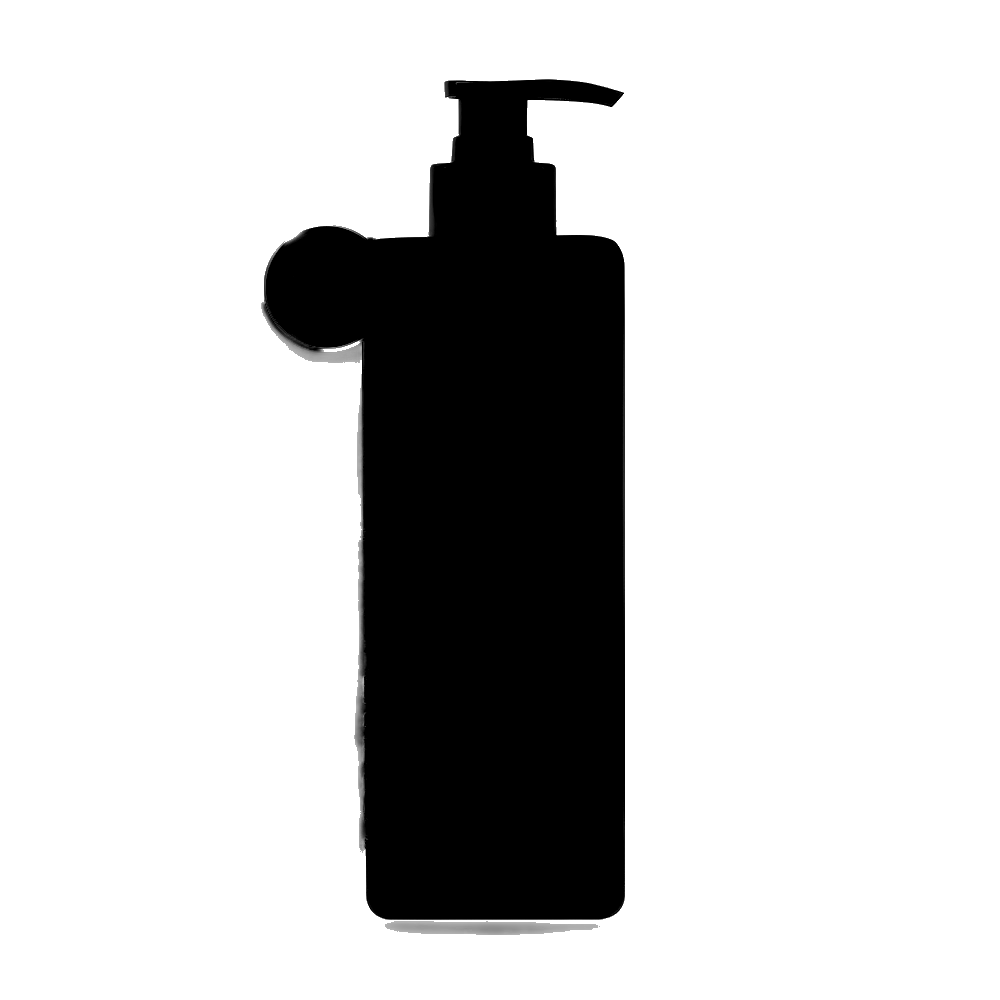

In [ ]:
uri = "shampoo/google_0000.jpg"
image = load_image(uri)
plt.imshow(image)
plt.show()
mask_image = get_mask(image)
mask_image

In [ ]:
import matplotlib.pyplot as plt
save_dir =  "/content/drive/MyDrive/Colab Notebooks/Hoc_nhom_KHDL/Big_homework/"

prompt = "Add background around this shampoo bottle, with table, tropical beach, an air of freshness and relaxation"
negative_prompt = "make the shampoo bottle rectangular"

final_images = pipe(prompt=prompt, image=image, mask_image=mask_image, num_images_per_prompt=4).images

  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
import base64
from io import BytesIO

json_imgs = {}
for i in range(len(final_images)):
  buffered = BytesIO()
  final_images[i].save(buffered, format="PNG")
  img_str = base64.b64encode(buffered.getvalue())
  json_imgs[f"{i}"] = img_str
json_imgs

{'0': 'iVBORw0KGgoAAAANSUhEUgAAAwAAAAMACAIAAAAc45fZAAEAAElEQVR4nFT9Z88sWYLfiR1/wpv05vHX1a3u6q42082e6ZnhkMsVlxQgigT0Th9G30CAPsECWnEFaiktNRTJodEMe2z77qouc93j05vw5sQxenG7hqMAEghkZOSbBBI//F3A/8P/5f9komB9SB7e3YuyHkRBrz8M4nh/2D/eLJ5enEzO5ptduX48cJ/Yrk0tuy67xfXC5MXV+Zz13Lt3t/V661iQBk5RS4mwwhwSK56OtDJdVaiywFq6rhv7LlIqPxx0IxChiDAtsR+5vb7HEOjKrC7KJk3zw9YYaEchtPD9clnX0Atjx4mmo+np2cz2XUQhhGZ/SO/u15ttdUgSTG1Cedjzzi/no2GMEU3TfHdMOglsx6KW1bSdbVuE8cN+X5cVIlAhUAspyqprO4OMAgAhNOgFvbDnuRahrCy6/SGxGLUdC0JQNyLJ6rYqCIKeH7qe53JOIFCyDVwnDv0mqzebPbNY2A+5TYCRVV1LpZXSnZGiVcxhDBGstOwEMng27vfioK2r5JgejlnVSddx+p7tYNi2tYTA6fVsygJMbZsf82yTbB6Wm1J0GOPT8cnF6WWVZ+vFg+VA4jE7GkLib/PqzZtboWBRluNhP+ZsuXjsGA0j1yihJOi6LvKc9f0GGufs/JRh2LZJLXLLwr7nUcWv39y1qP7o46+HTiTq6pAcsqzo9ePLy9N+r7+6X252e2W0x8As9Kejk7Ph2IVYdQJAQym1bKttxTFJADSWzThjWmspBUTGQIRsm3EHAXhsmrxqD1V+fXf/+t397d1tq7Tl+VmRbw/7qq2JhYaTYHo64RbSdW0TOh71GeGdUBxAi/uBH8VhwCGsq7KqO0gY4dxoaaSG0uhGce75nscJ6LREBEGCPIcRbA5pccgKximyeGOgNrBMj8fNUWtoWRQRiAgEGDGL+pajFdRGAKSlquuiIRARb

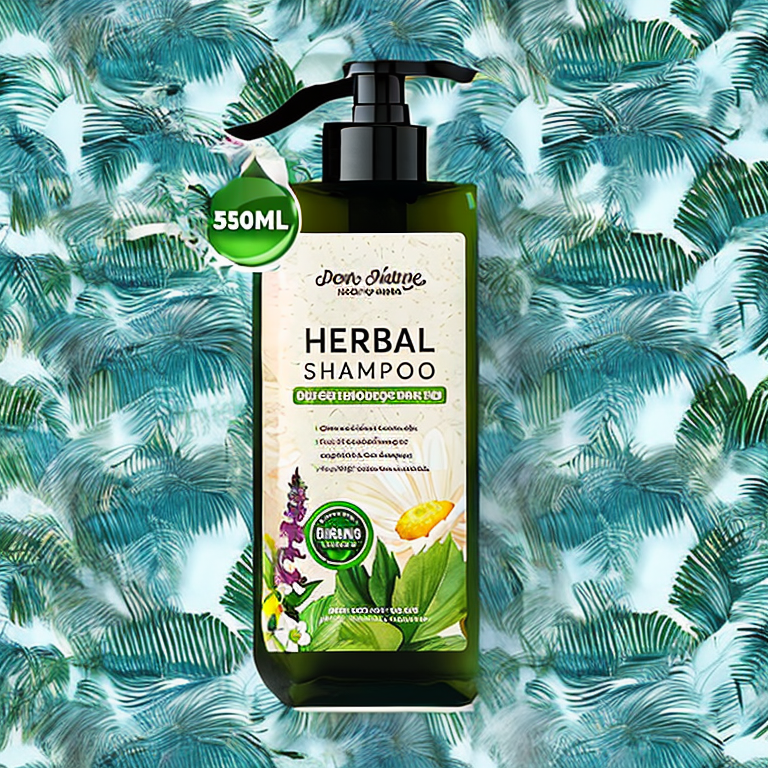

In [ ]:
from PIL import Image
json_imgs["0"]

base64_image = base64.b64decode(json_imgs["0"])
buffer = BytesIO(base64_image)
image = Image.open(buffer)
image

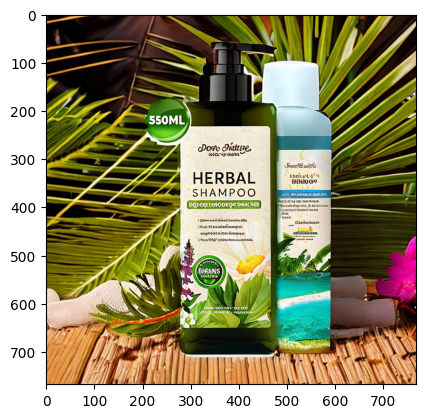

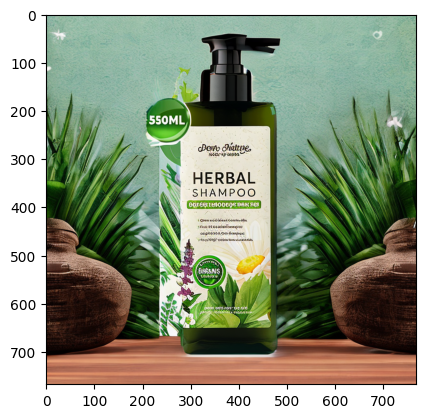

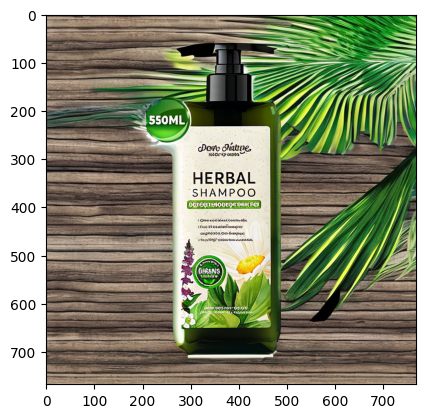

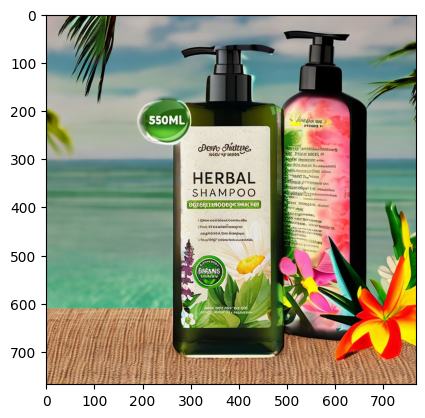

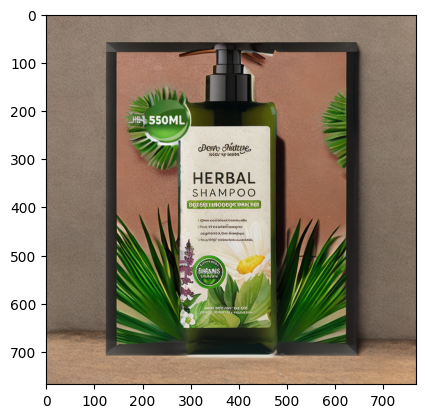

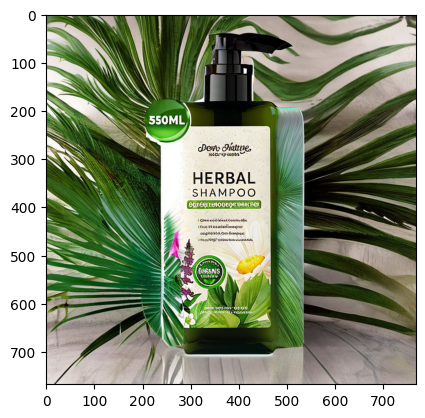

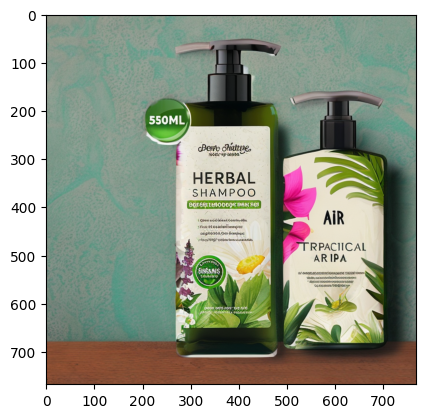

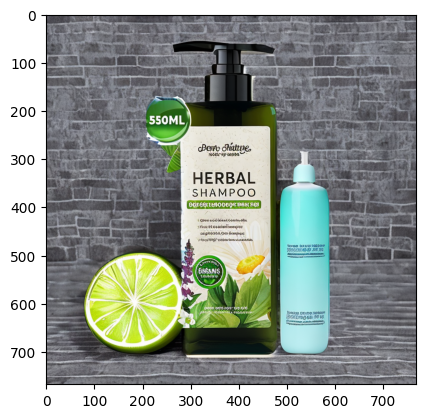

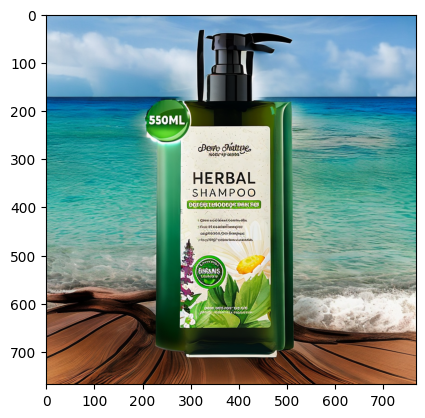

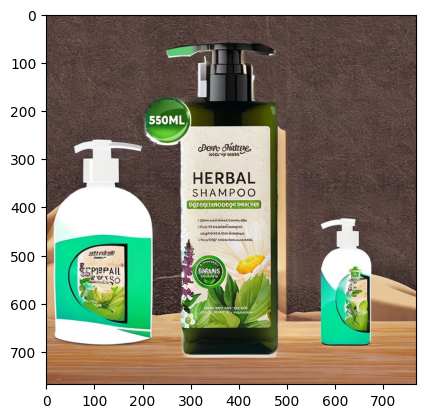

In [ ]:
for i in range(len(final_images)):
  plt.imshow(final_images[i])
  plt.show()

In [ ]:
save_path = f"{save_dir}/sd_results_shampoo"
save_results(final_image, save_path)

In [ ]:
pipe.save_pretrained(f"{save_dir}/stable-diffusion-2-1")

In [1]:
# START AFTER THIS LINE

In [2]:
!pip install diffusers transformers accelerate scipy safetensors
!pip install carvekit

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 28.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.4/297.4 kB 34.5 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylin

In [18]:
import json
from typing import List
import requests as r
import base64
from io import BytesIO
import json

from PIL import Image

from carvekit.api.interface import Interface
from carvekit.ml.wrap.fba_matting import FBAMatting
from carvekit.ml.wrap.tracer_b7 import TracerUniversalB7
from carvekit.pipelines.postprocessing import MattingMethod
from carvekit.pipelines.preprocessing import PreprocessingStub
from carvekit.trimap.generator import TrimapGenerator

import cv2
import numpy as np

import requests
from diffusers.utils import make_image_grid, load_image

from diffusers import StableDiffusionInpaintPipeline
import torch

In [4]:
# Carvekit initialization
seg_net = TracerUniversalB7(device="cpu", batch_size=1)

fba = FBAMatting(device="cpu", input_tensor_size=2048, batch_size=1)

trimap = TrimapGenerator()

preprocessing = PreprocessingStub()

postprocessing = MattingMethod(
    matting_module=fba, trimap_generator=trimap, device="cpu"
)

carvekit_processor = Interface(
    pre_pipe=preprocessing, post_pipe=postprocessing, seg_pipe=seg_net
)

/usr/local/lib/python3.10/dist-packages/carvekit/utils/download_models.py:106: UserWarning: Failed to download model from Carve CDN downloader. Trying to download from Huggingface.co downloader.
  warnings.warn(


In [5]:
# Stable diffusion initialization
model_id = "stabilityai/stable-diffusion-2-1"
# model_id = "runwayml/stable-diffusion-inpainting"
pipe = StableDiffusionInpaintPipeline.from_pretrained(
    model_id,
    revision="fp16",
    torch_dtype=torch.float16,
)
pipe = pipe.to("cuda")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/517 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/diffusers/pipelines/pipeline_loading_utils.py:212: FutureWarning: You are loading the variant fp16 from stabilityai/stable-diffusion-2-1 via `revision='fp16'` even though you can load it via `variant=`fp16`. Loading model variants via `revision='fp16'` is deprecated and will be removed in diffusers v1. Please use `variant='fp16'` instead.
  warnings.warn(
unet/diffusion_pytorch_model.safetensors not found


Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/628 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/351 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/999 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/681M [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/819 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/1.73G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

In [49]:
def carvekit_processing(input_image_path):
    try:
        input_image = Image.open(input_image_path)
        rmbg_image = carvekit_processor([input_image])[0]
        return rmbg_image
    except:
        return False

In [50]:
# Get mask of image
def get_mask(rmbg_image):
  bg = np.array(rmbg_image)
  mask_image = Image.fromarray(cv2.bitwise_not(bg[:, :, 3]))
  return mask_image

In [51]:
def encode_image(image: Image):
    return base64.b64encode(image.tobytes()).decode("utf-8")

In [52]:
# Predict
def predict(prompt, negative_prompt, rmbg_image, mask_image):

  # LOCAL
  final_images = pipe(prompt=prompt, image=rmbg_image, mask_image=mask_image, num_images_per_prompt=4).images

  # HOSTING
  # encoded_rmbg_image = encode_image(rmbg_image)
  # encoded_mask_image = encode_image(mask_image)

  # prepare sample payload
  # request = {
  #     "inputs": prompt,
  #     "image": encoded_rmbg_image,
  #     "mask_image": encoded_mask_image,
  # }
  # # headers
  # headers = {
  #     "Authorization": f"Bearer {HF_TOKEN}",
  #     "Content-Type": "application/json",
  #     "Accept": "application/json",
  # }

  # response = requests.post(ENDPOINT_URL, headers=headers, json=request)

  # Post-processing response
  json_imgs = {}
  for i in range(len(final_images)):
    buffered = BytesIO()
    final_images[i].save(buffered, format="PNG")
    img_str = base64.b64encode(buffered.getvalue())
    json_imgs[f"{i}"] = img_str

  return json_imgs

In [53]:
def receive_image(token, prompt, negative_prompt, input_image_path):
  # # Validate token
  # if not await validate_token(token):
  #     return return_response_handler()

  # # print(token)

  # # Validate input image
  # if img_file.content_type.split("/")[0] != "image":
  #     return return_response_handler()

  rmbg_image = carvekit_processing(input_image_path)

  mask_image = get_mask(rmbg_image)

  new_background_images = predict(prompt=prompt, negative_prompt=negative_prompt, rmbg_image=rmbg_image, mask_image=mask_image)

  return new_background_images

In [54]:
prompt = "perfume bottle on a marble countertop in front of moonlit lake"
negative_prompt = ""
# negative_prompt = "make the shampoo bottle rectangular"

url = "https://wordlab.io/wp-content/uploads/2023/10/brown-perfume-photography-result-3.jpeg"

input_image_path = "perfume.jpg"
response = Image.open(requests.get(url, stream=True).raw)
response.save(input_image_path)

final_images = receive_image(token="", prompt=prompt, negative_prompt=negative_prompt, input_image_path=input_image_path)

  0%|          | 0/50 [00:00<?, ?it/s]

RuntimeError: The size of tensor a (768) must match the size of tensor b (96) at non-singleton dimension 3

In [ ]:
final_images["0"]

In [ ]:
base64_image = base64.b64decode(final_images["0"])
buffer = BytesIO(base64_image)
image = Image.open(buffer)
image